## Opening an Image

In [17]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

In [18]:
image_file = "../assets/image_02.jpg"
img = cv2.imread(image_file)

In [19]:
cv2.imshow("Image title", img)
cv2.waitKey(0)

-1

In [20]:
def display_img(im_path):
    dpi = 80
    im_data = plt.imread(im_path)
    
    # If the image is grayscale, add a dummy channel to maintain compatibility
    if len(im_data.shape) == 2:  # Grayscale image
        im_data = im_data[:, :, np.newaxis]
    
    print(im_data.shape)
    height, width = im_data.shape[:2]

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axis that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Handle grayscale separately for display
    if im_data.shape[-1] == 1:
        ax.imshow(im_data[:, :, 0], cmap='gray')
    else:
        ax.imshow(im_data)

    plt.show()


(1522, 1200, 3)


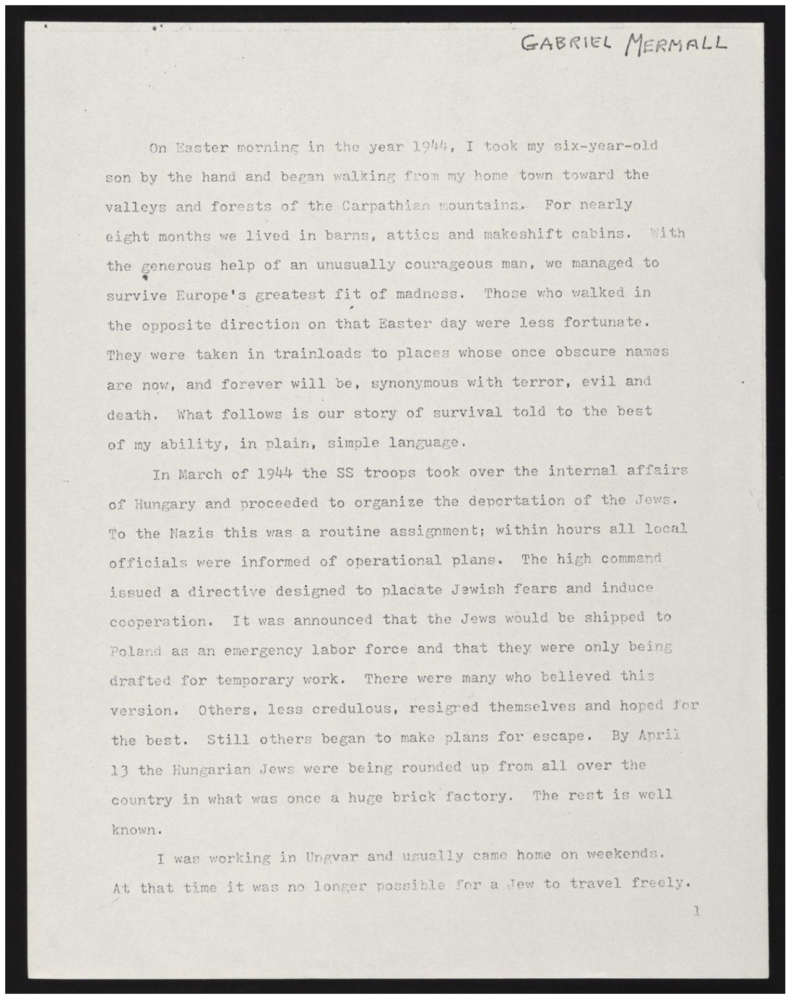

In [21]:
display_img(image_file)

## 01. Inverted Images

In [22]:
inverted_img = cv2.bitwise_not(img)
cv2.imwrite("../assets/temp/inverted_image.jpg", inverted_img)

True

(1522, 1200, 3)


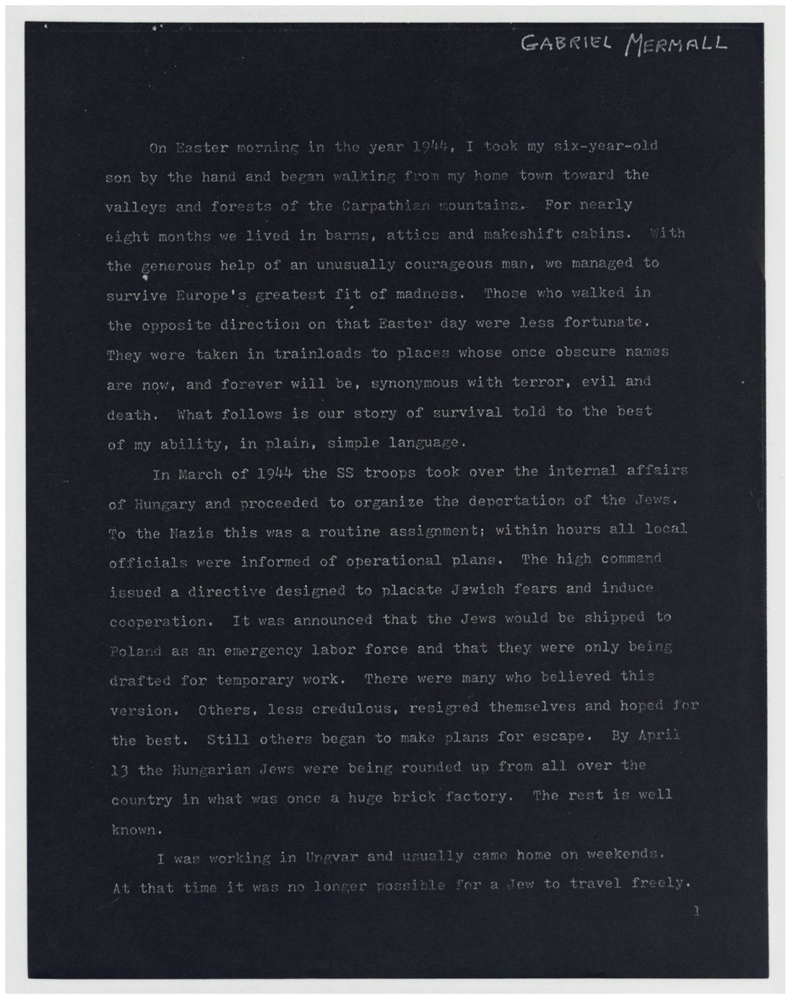

In [23]:
display_img("../assets/temp/inverted_image.jpg")

## 02. Rescaling

## 03. Binarization

In [24]:
def grayscale(image):
  return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [25]:
grayscale_img = grayscale(img)
cv2.imwrite("../assets/temp/grayscale_image.jpg", grayscale_img)

True

(1522, 1200, 1)


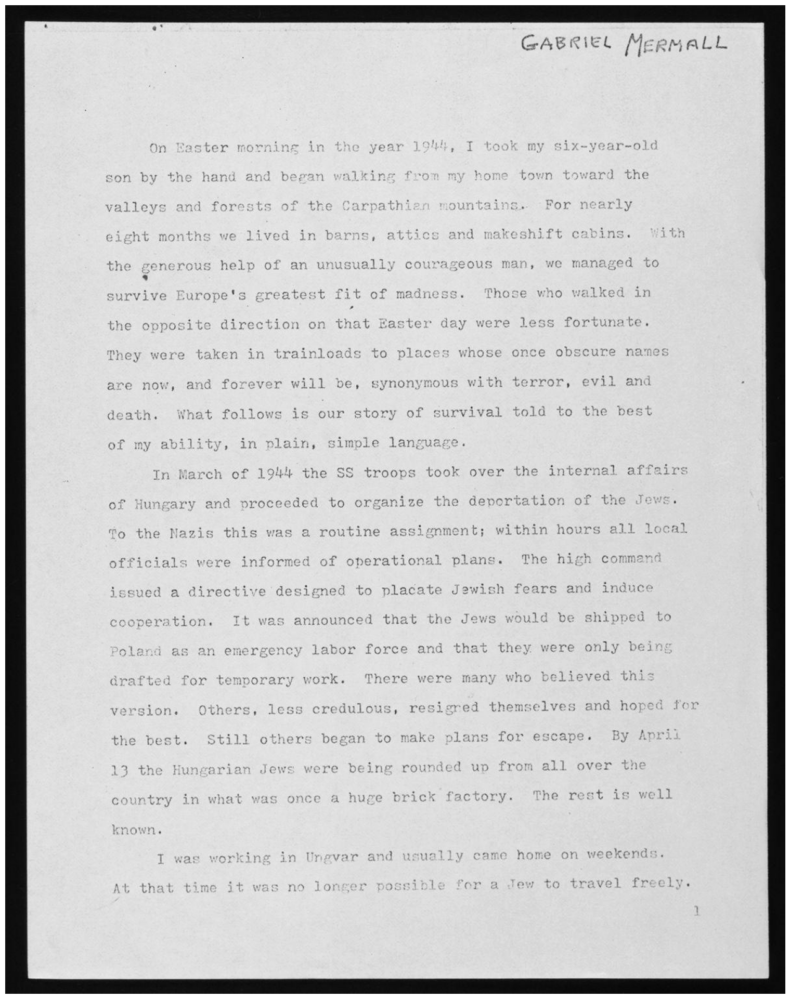

In [26]:
display_img("../assets/temp/grayscale_image.jpg")

In [27]:
thresh, im_bw = cv2.threshold(grayscale_img, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("../assets/temp/binary_image.jpg", im_bw)

True

(1522, 1200, 1)


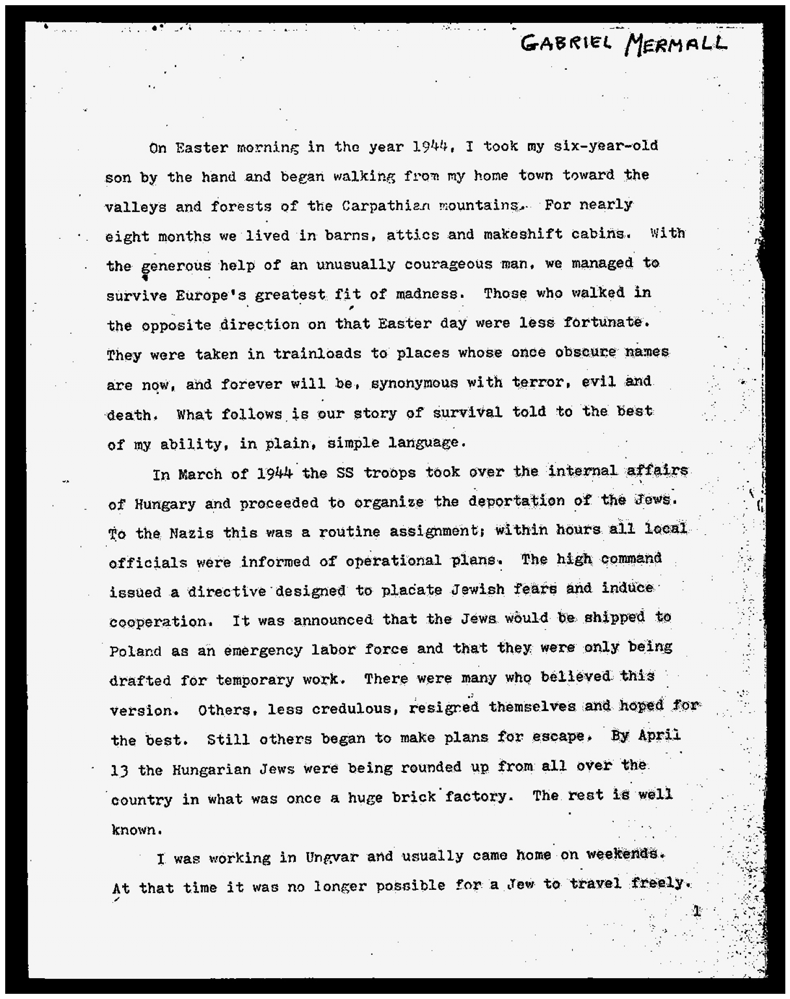

In [28]:
display_img("../assets/temp/binary_image.jpg")

## 04. Noise Removal

In [29]:
def noise_removal(image):
  kernel = np.ones((1, 1), np.uint8)
  image = cv2.dilate(image, kernel, iterations=1)
  
  kernel = np.ones((1, 1), np.uint8)
  image = cv2.erode(image, kernel, iterations=1)
  image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image = cv2.medianBlur(image, 3)
  
  return image

In [30]:
no_noise = noise_removal(im_bw)
cv2.imwrite("../assets/temp/no_noise_image.jpg", no_noise)

True

(1522, 1200, 1)


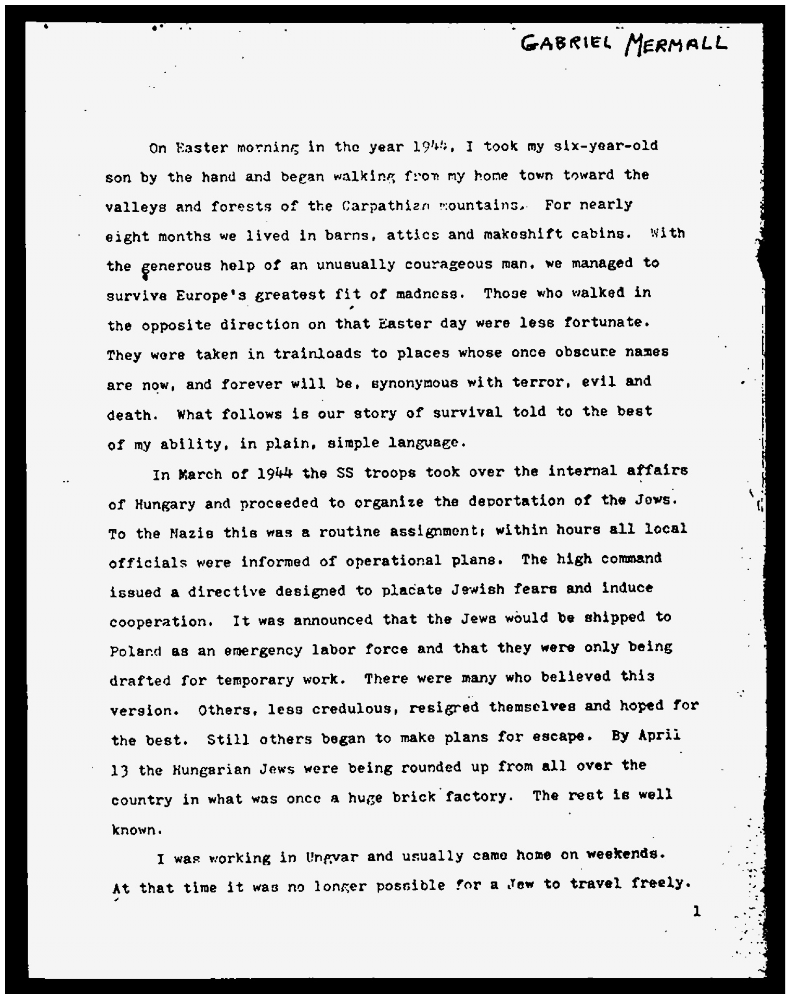

In [31]:
display_img("../assets/temp/no_noise_image.jpg")

## 05. Dilation and Erosion

In [32]:
def thin_font(image):
  image = cv2.bitwise_not(image)

  kernel = np.ones((2, 2), np.uint8)
  # erode means thinning the pixels
  image = cv2.erode(image, kernel, iterations=1)
  
  image = cv2.bitwise_not(image)
  return image

In [33]:
def thick_font(image):
  image = cv2.bitwise_not(image)

  kernel = np.ones((2, 2), np.uint8)
  # dilate means expansion of the pixels
  image = cv2.dilate(image, kernel, iterations=1)
  
  image = cv2.bitwise_not(image)
  return image

In [34]:
eroded_image = thin_font(no_noise)
cv2.imwrite("../assets/temp/eroded_image.jpg", eroded_image)

True

(1522, 1200, 1)


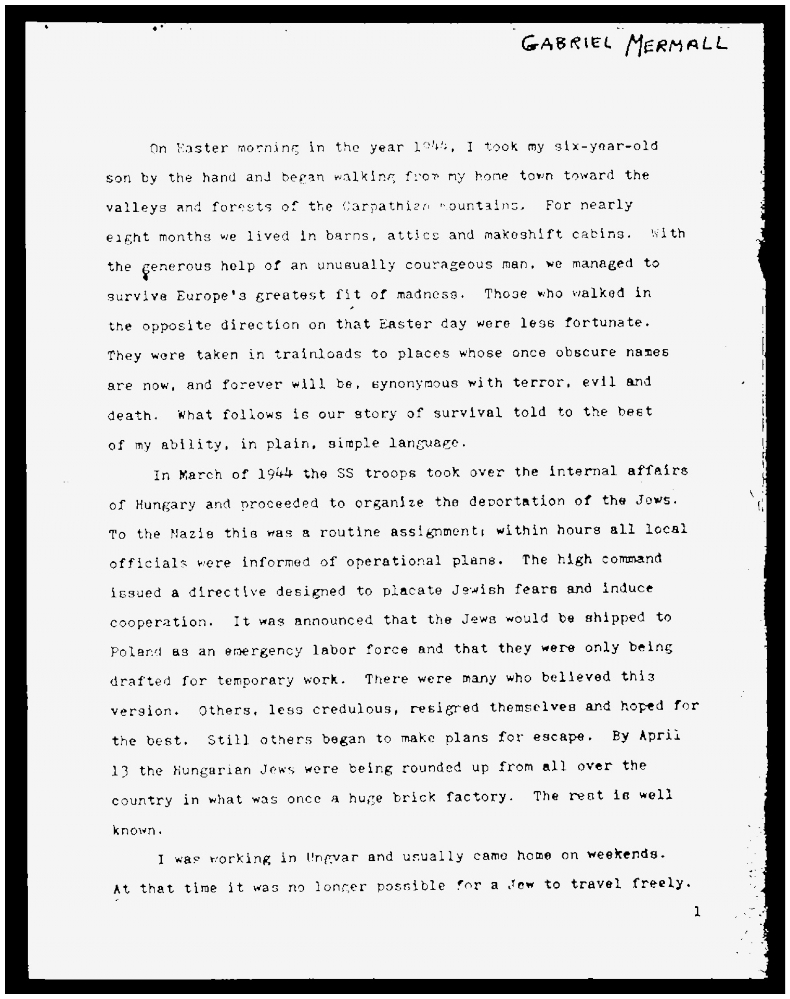

In [35]:
display_img("../assets/temp/eroded_image.jpg")

In [36]:
dilated_image = thick_font(no_noise)
cv2.imwrite("../assets/temp/dilated_image.jpg", dilated_image)

True

(1522, 1200, 1)


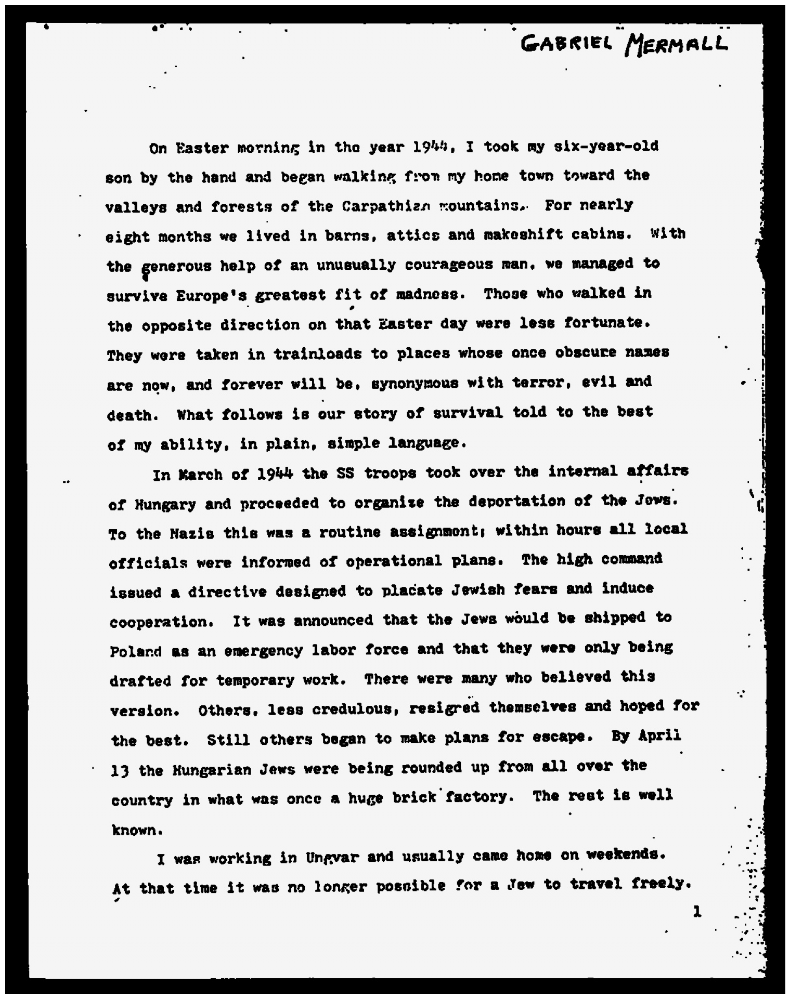

In [37]:
display_img("../assets/temp/dilated_image.jpg")

## 06. Rotation / Deskewing

In [38]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
def getSkewAngle(cvImage) -> float:
  # Prep image, copy, convert to gray scale, blur, and threshold
  newImage = cvImage.copy()
  gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (9, 9), 0)
  thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

  # Apply dilate to merge text into meaningful lines/paragraphs.
  # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
  # But use smaller kernel on Y axis to separate between different blocks of text
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
  dilate = cv2.dilate(thresh, kernel, iterations=2)

  # Find all contours
  contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  contours = sorted(contours, key = cv2.contourArea, reverse = True)
  for c in contours:
      rect = cv2.boundingRect(c)
      x,y,w,h = rect
      cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

  # Find largest contour and surround in min area box
  largestContour = contours[0]
  print (len(contours))
  minAreaRect = cv2.minAreaRect(largestContour)
  cv2.imwrite("temp/boxes.jpg", newImage)
  # Determine the angle. Convert it to the value that was originally used to obtain skewed image
  angle = minAreaRect[-1]
  if angle < -45:
      angle = 90 + angle
  return -1.0 * angle


# Rotate the image around its center
def rotateImage(cvImage, angle: float):
  newImage = cvImage.copy()
  (h, w) = newImage.shape[:2]
  center = (w // 2, h // 2)
  M = cv2.getRotationMatrix2D(center, angle, 1.0)
  newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
  return newImage

In [39]:
angled_image = cv2.imread("../assets/image_03.jpg")

In [40]:
# Deskew image
def deskew(cvImage):
  angle = getSkewAngle(cvImage)
  return rotateImage(cvImage, -1.0 * angle)

In [41]:
fixed_img = deskew(angled_image)
cv2.imwrite("../assets/temp/fixed_image.jpg", fixed_img)

28


True

(1251, 1006, 3)


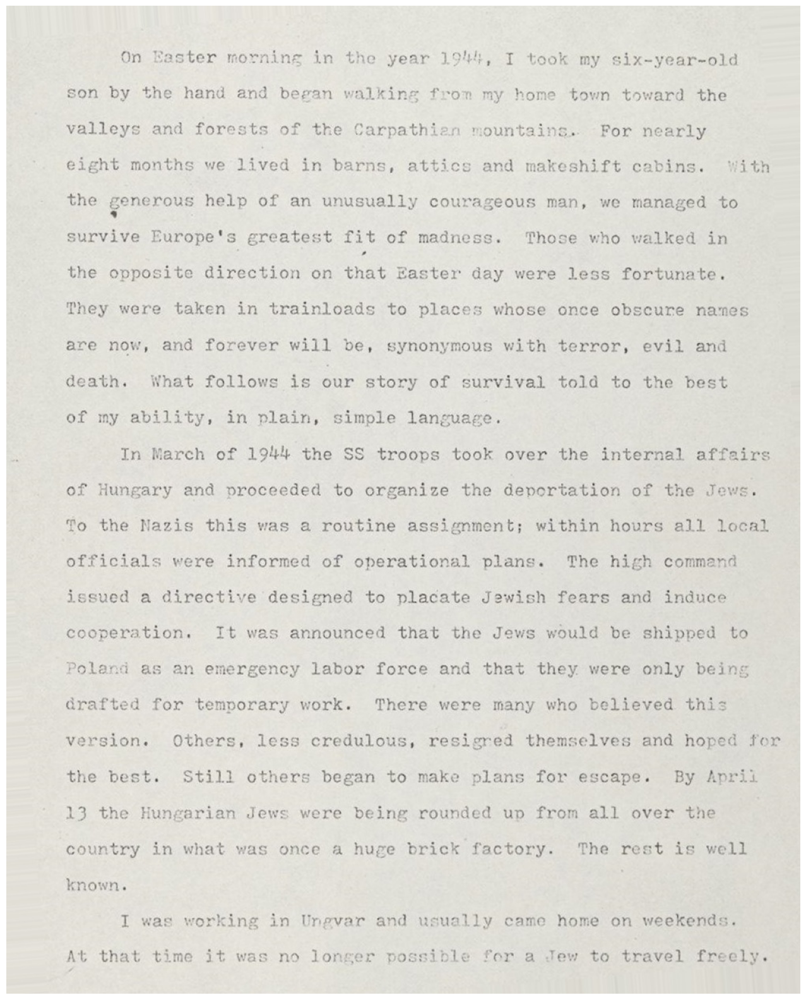

In [42]:
display_img("../assets/temp/fixed_image.jpg")

## 07. Removing borders

(1522, 1200, 1)


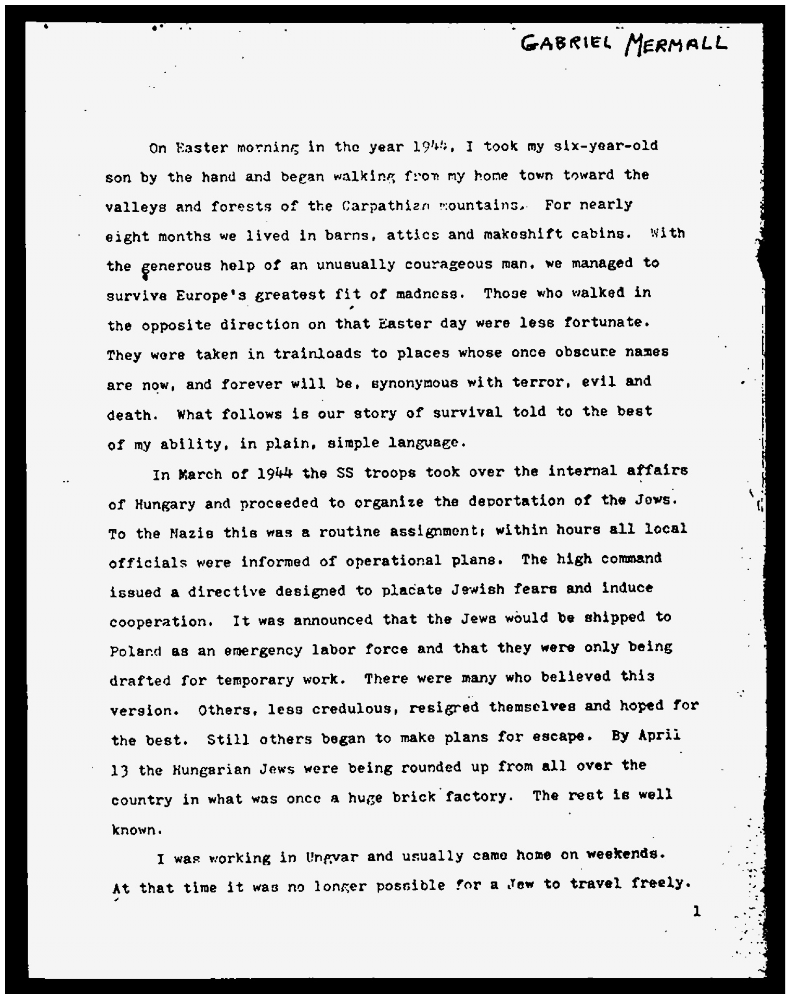

In [43]:
display_img("../assets/temp/no_noise_image.jpg")

In [47]:
def remove_borders(image):
  contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  cntSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
  cnt = cntSorted[-1]
  x, y, w, h = cv2.boundingRect(cnt)
  crop = image[y:y+h, x:x+w]
  return crop

In [48]:
no_borders = remove_borders(no_noise)
cv2.imwrite("../assets/temp/no_borders_image.jpg", no_borders)

True

(1473, 1142, 1)


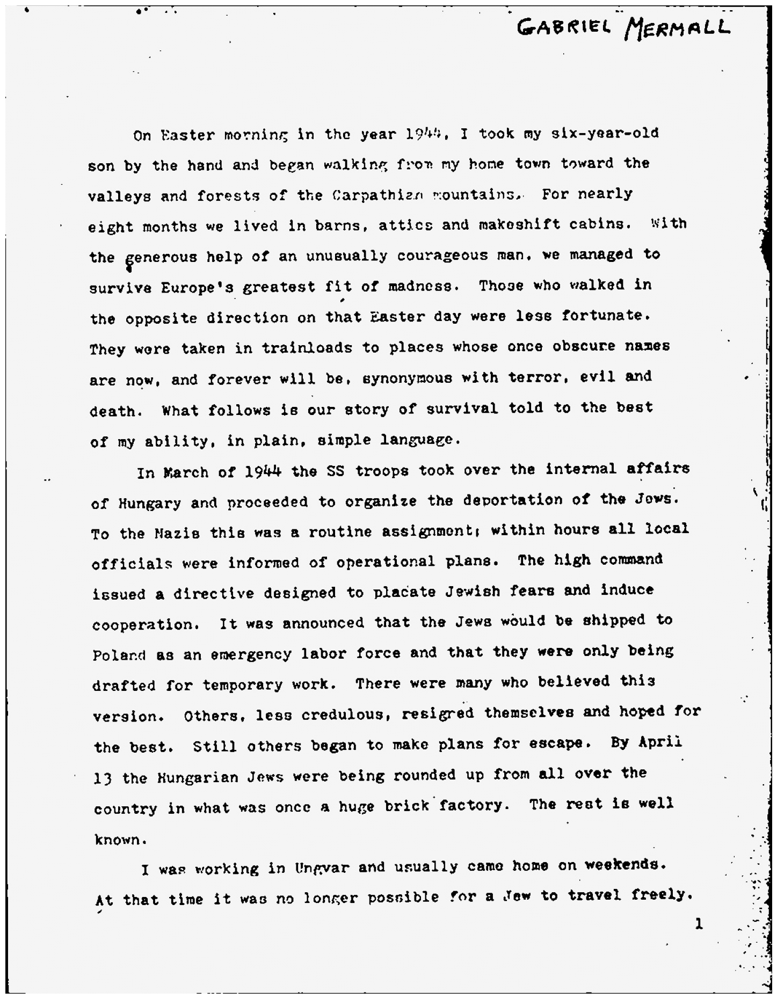

In [49]:
display_img("../assets/temp/no_borders_image.jpg")

## 08. Missing borders

In [54]:
color = [255,255,255]
top, bottom, left, right = [50]*4

In [55]:
border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("../assets/temp/bordered_image.jpg", border)

True

(1573, 1242, 1)


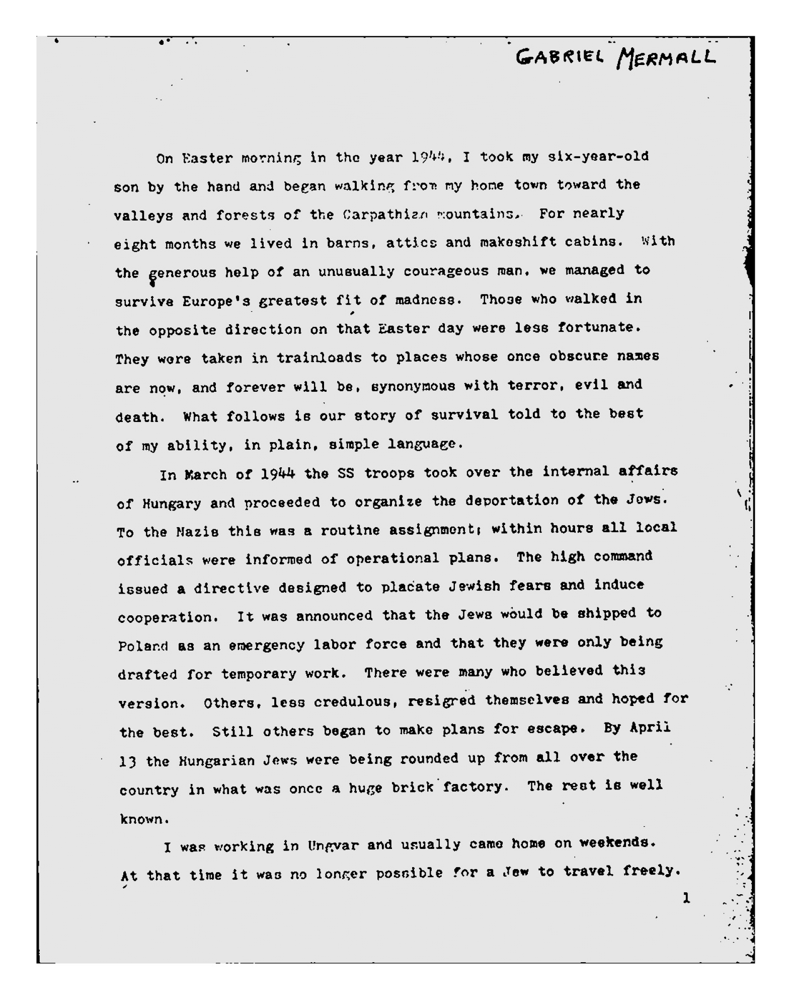

In [56]:
display_img("../assets/temp/bordered_image.jpg")